# COVID-19 in United States

  **The World Health Organization has declared coronavirus a pandemic.**
    In this notebook we have tried to understand and model the epidemic with the data we have.
    
<center>
 
<img src="images/corona.jfif" width=600 />
</center>


# --} Importing Libraries:

In [630]:
## Installing EoN package
!pip install EoN
!pip install folium 

In [631]:
import pandas as pd
import numpy as np
from statistics import mean 
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from pandas.plotting import parallel_coordinates
import folium 
import os
from collections import Counter
from scipy.optimize import curve_fit
from scipy.optimize import fsolve
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from scipy.integrate import odeint
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
import statsmodels.tsa.api as smt
import networkx as nx
import EoN
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from datetime import date, timedelta

In [632]:
#To display all columns uncomment code bellow
pd.set_option('display.max_columns', None)

# --} Reading data:

In [633]:
# This dataset gives number of cases,deaths and fips on each date in each state of USA
# Dataset is used  to see how many cases and deaths are there on each date in each state
covid_19_USA = pd.read_csv("data/us-states.csv")
covid_19_USA

,date,state,fips,cases,deaths
0,2020-01-21,Washington,53,1,0
1,2020-01-22,Washington,53,1,0
2,2020-01-23,Washington,53,1,0
3,2020-01-24,Illinois,17,1,0
4,2020-01-24,Washington,53,1,0
...,...,...,...,...,...
2772,2020-04-21,Virginia,51,9630,325
2773,2020-04-21,Washington,53,12345,683
2774,2020-04-21,West Virginia,54,929,26
2775,2020-04-21,Wisconsin,55,4620,243


In [634]:
# This dataset gives number of cases,deaths,fips on each date in each county and in each state of USA
# extra information we got from this dataset is how many cases are there county wise
nytimes_county = pd.read_csv("data/us-counties.csv")
nytimes_county.head()

,date,county,state,fips,cases,deaths
0,2020-01-21,Snohomish,Washington,53061.0,1,0
1,2020-01-22,Snohomish,Washington,53061.0,1,0
2,2020-01-23,Snohomish,Washington,53061.0,1,0
3,2020-01-24,Cook,Illinois,17031.0,1,0
4,2020-01-24,Snohomish,Washington,53061.0,1,0


In [635]:
# This dataset gives cases in each state alongwith longitude and latitude
# which is used in visualtion to see which are of usa is highle affected by corona
covid19usconfirmed=pd.read_csv("data/time_series_covid_19_confirmed_US.csv")
covid19usconfirmed.head()

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,Combined_Key,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20
0,16,AS,ASM,16,60.0,NaN,American Samoa,US,-14.2710,-170.1320,"American Samoa, US",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,316,GU,GUM,316,66.0,NaN,Guam,US,13.4443,144.7937,"Guam, US",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,3,5,12,14,15,27,29,32,37,45,51,55,56,58,69,77,82,84,93,112,113,121,121,128,130,133,133,133,133,135,135,136,136,136,136,136
2,580,MP,MNP,580,69.0,NaN,Northern Mariana Islands,US,15.0979,145.6739,"Northern Mariana Islands, US",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,6,6,8,8,8,8,8,11,11,11,11,11,11,11,13,13,13,14,14,14,14
3,630,PR,PRI,630,72.0,NaN,Puerto Rico,US,18.2208,-66.5901,"Puerto Rico, US",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,5,5,5,14,21,23,31,39,51,64,79,100,127,174,239,286,316,316,452,475,513,573,620,683,725,788,897,903,923,974,1043,1068,1118,1213,1252,1298
4,850,VI,VIR,850,78.0,NaN,Virgin Islands,US,18.3358,-64.8963,"Virgin Islands, US",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,2,3,3,6,6,7,17,17,17,19,22,23,30,30,30,30,37,40,42,43,43,45,45,50,51,51,51,51,51,51,51,53,53,53,53


In [636]:
# This dataset gives us population estimation of each country. 
# used to see what is the total population of us
usstate = pd.read_csv("data/PopulationEstimates_us_county_level_2018.csv")
usstate

,FIPS,State,Area_Name,POP_ESTIMATE_2018
0,0.0,US,United States,"327,167,434"
1,1000.0,AL,Alabama,"4,887,871"
2,1001.0,AL,Autauga County,"55,601"
3,1003.0,AL,Baldwin County,"218,022"
4,1005.0,AL,Barbour County,"24,881"
...,...,...,...,...
3269,72147.0,PR,"Vieques Municipio, Puerto Rico","8,364"
3270,72149.0,PR,"Villalba Municipio, Puerto Rico","21,476"
3271,72151.0,PR,"Yabucoa Municipio, Puerto Rico","32,158"
3272,72153.0,PR,"Yauco Municipio, Puerto Rico","33,860"


In [637]:
# above all datasets does not have any information on recovered cases. 
# This dataset has no of confirmed cases,recovered,deaths for evey county on each date
# used this dataset in SIR model as in SIR we need number of recovered cases also.
# This dataset has information of all countries. So we will filter data od US country only. 
CDR = pd.read_csv("data/covid_19_data.csv")
CDR.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0


#### FIPS codes, a standard geographic identifier, to make it easier for an analyst to combine this data with other data sets like a map file or population data.

# --} Data Cleaning & Inspection:

> #### Dataset(1) - covid_19_USA 

In [638]:
# Info of dataset and to see type of each column
covid_19_USA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2777 entries, 0 to 2776
Data columns (total 5 columns):
date      2777 non-null object
state     2777 non-null object
fips      2777 non-null int64
cases     2777 non-null int64
deaths    2777 non-null int64
dtypes: int64(3), object(2)
memory usage: 108.6+ KB


In [639]:
covid_19_USA.shape

(2777, 5)

In [640]:
covid_19_USA.isnull().sum()
# observation : in this dataset no column has null value so we do not need to remove or replace any column values

date      0
state     0
fips      0
cases     0
deaths    0
dtype: int64

In [641]:
# Performed this step to know what is the mean,min,count for each column
covid_19_USA.describe()

,fips,cases,deaths
count,2777.000000,2777.000000,2777.000000
mean,31.368743,4312.975513,166.633417
std,18.327064,17514.000683,876.398192
min,1.000000,0.000000,0.000000
25%,17.000000,17.000000,0.000000
50%,31.000000,315.000000,5.000000
75%,46.000000,2015.000000,52.000000
max,78.000000,251720.000000,14828.000000


In [642]:
# datatypes of every colum
covid_19_USA.dtypes

date      object
state     object
fips       int64
cases      int64
deaths     int64
dtype: object

In [643]:
# Changing datatypes as we need the numerical data types as integers as we will need to count/sum them
covid_19_USA = covid_19_USA.astype({'cases': "int64",'deaths': "int64" })

> #### Dataset(2) - covid19usconfirmed

In [644]:
# info of datset
covid19usconfirmed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3269 entries, 0 to 3268
Columns: 102 entries, UID to 4/21/20
dtypes: float64(3), int64(93), object(6)
memory usage: 2.5+ MB


In [645]:
covid19usconfirmed.describe()

,UID,code3,FIPS,Lat,Long_,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20
count,3.269000e+03,3269.000000,3251.000000,3261.000000,3261.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000,3269.000000
mean,8.390382e+07,839.446926,32090.929560,37.165903,-89.160375,0.000306,0.000306,0.000612,0.000612,0.001530,0.001530,0.001530,0.001530,0.001530,0.002141,0.002447,0.002447,0.003365,0.003365,0.003365,0.003365,0.003365,0.003365,0.003365,0.003365,0.003671,0.003671,0.003977,0.003977,0.003977,0.003977,0.003977,0.003977,0.003977,0.003977,0.004589,0.004589,0.004589,0.004589,0.004589,0.004589,0.004894,0.004894,0.007342,0.009177,0.016213,0.022331,0.031814,0.052615,0.066381,0.102784,0.137657,0.157235,0.216580,0.338024,0.476292,0.656776,0.873968,0.892628,1.317528,1.864790,2.714286,4.311410,5.935454,7.869379,10.288773,13.356684,16.438054,20.121750,25.645763,31.097277,37.156623,43.104619,49.504742,57.562557,65.271337,74.567758,84.302845,94.479351,103.111655,112.164882,121.598348,131.248700,141.566228,151.892016,161.026614,169.872438,177.613643,185.888651,194.661976,204.219027,214.042827,223.981952,232.207403,239.928418,251.999388
std,3.284446e+06,18.046859,17825.153176,8.662455,21.547038,0.017490,0.017490,0.024731,0.024731,0.039085,0.039085,0.039085,0.039085,0.039085,0.052435,0.055263,0.055263,0.072046,0.072046,0.072046,0.072046,0.072046,0.072046,0.072046,0.072046,0.074125,0.074125,0.080063,0.080063,0.080063,0.080063,0.080063,0.080063,0.080063,0.080063,0.083767,0.083767,0.083767,0.083767,0.083767,0.083767,0.089062,0.089062,0.144062,0.192996,0.322618,0.449864,0.646687,1.090034,1.229557,1.809761,2.295894,2.506856,2.999014,4.540228,6.316456,7.866677,9.854388,9.929083,13.951156,20.486168,37.253790,73.239678,96.148424,138.844201,179.445050,230.496742,280.634713,336.236705,413.050025,485.943441,565.667850,642.442317,715.559828,821.278549,906.675542,995.089631,1101.537483,1220.005493,1307.614714,1400.524065,1493.389807,1597.380387,1705.089885,1813.610583,1921.771762,2016.078007,2088.083334,2164.123163,2305.711404,2402.651231,2486.842449,2633.172625,2698.883741,2756.874547,2820.204161
min,1.600000e+01,16.000000,60.000000,-14.271000,-170.132000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000

In [646]:
covid19usconfirmed.isnull().sum()
# observation : FIPS column  has NAN  values. so we need to remove or replace any column values.

UID         0
iso2        0
iso3        0
code3       0
FIPS       18
           ..
4/17/20     0
4/18/20     0
4/19/20     0
4/20/20     0
4/21/20     0
Length: 102, dtype: int64

In [647]:
# because there is NaN in columns we wont be using so we will fill it with "0"
covid19usconfirmed.fillna(0,inplace=True)

In [648]:
# again checking if all NAN values are removed from FIPS column
covid19usconfirmed.isnull().sum()
# observation : all NAN values are removed

UID        0
iso2       0
iso3       0
code3      0
FIPS       0
          ..
4/17/20    0
4/18/20    0
4/19/20    0
4/20/20    0
4/21/20    0
Length: 102, dtype: int64

> #### Dataset(3) - usstate 

In [649]:
usstate

,FIPS,State,Area_Name,POP_ESTIMATE_2018
0,0.0,US,United States,"327,167,434"
1,1000.0,AL,Alabama,"4,887,871"
2,1001.0,AL,Autauga County,"55,601"
3,1003.0,AL,Baldwin County,"218,022"
4,1005.0,AL,Barbour County,"24,881"
...,...,...,...,...
3269,72147.0,PR,"Vieques Municipio, Puerto Rico","8,364"
3270,72149.0,PR,"Villalba Municipio, Puerto Rico","21,476"
3271,72151.0,PR,"Yabucoa Municipio, Puerto Rico","32,158"
3272,72153.0,PR,"Yauco Municipio, Puerto Rico","33,860"


In [650]:
usstate.describe()

,FIPS
count,3273.000000
mean,31358.511763
std,16305.188962
min,0.000000
25%,19025.000000
50%,30021.000000
75%,46101.000000
max,72153.000000


In [651]:
usstate.isnull().sum()

FIPS                 1
State                1
Area_Name            1
POP_ESTIMATE_2018    1
dtype: int64

In [652]:
#checking the row with NaN values
usstate[usstate.isnull().any(axis=1)]
# Observation : row 3273 has all coumns as NAN. so we need to remove those column

,FIPS,State,Area_Name,POP_ESTIMATE_2018
3273,NaN,NaN,NaN,NaN


In [653]:
# lets drop this row
usstate.dropna(axis=0,inplace=True)

In [654]:
usstate.dtypes

FIPS                 float64
State                 object
Area_Name             object
POP_ESTIMATE_2018     object
dtype: object

In [655]:
# removing the commas in the population column 
usstate['POP_ESTIMATE_2018']=usstate['POP_ESTIMATE_2018'].str.replace(',', '')

#converting population number to integer
usstate['POP_ESTIMATE_2018']=usstate['POP_ESTIMATE_2018'].astype(int)

In [656]:
#filling null values with 0 
usstate = usstate.fillna(0)

> #### DataFrame(4) CDR

In [657]:
# Since CDR data has cases for every country we fiter out the cases for country US.
# So now our dataframe has no of confirmed cases,deaths cases and recovered cases on each date in country US
CDR = CDR[CDR["Country/Region"] == "US"]
# column "SNo" and "Last Update" is not of any use in SIR model so we dropped those columns so that the dataframe has only columns which are required
CDR.drop(["SNo","Last Update"],axis=1,inplace=True)
CDR.reset_index(drop=True, inplace= True)

In [658]:
CDR.describe()

,Confirmed,Deaths,Recovered
count,3369.000000,3369.000000,3369.000000
mean,3558.696052,143.479074,237.872959
std,16114.523459,927.586095,3401.293467
min,0.000000,0.000000,0.000000
25%,2.000000,0.000000,0.000000
50%,103.000000,1.000000,0.000000
75%,1426.000000,32.000000,0.000000
max,258361.000000,19104.000000,75204.000000


In [659]:
# Checked that no column has null value in it
CDR.isnull().any()

ObservationDate    False
Province/State     False
Country/Region     False
Confirmed          False
Deaths             False
Recovered          False
dtype: bool

In [660]:
# datatypes of each column are noted
CDR.dtypes

ObservationDate     object
Province/State      object
Country/Region      object
Confirmed          float64
Deaths             float64
Recovered          float64
dtype: object

# ---} Plotting & Visualizations

> ## TOP 10 CITIES with Highest cases in US

In [661]:
# This dataset has no of cases and death  on each date. So to know total number of cases in each state we have to sum dataset statewise
covid_19_USA

,date,state,fips,cases,deaths
0,2020-01-21,Washington,53,1,0
1,2020-01-22,Washington,53,1,0
2,2020-01-23,Washington,53,1,0
3,2020-01-24,Illinois,17,1,0
4,2020-01-24,Washington,53,1,0
...,...,...,...,...,...
2772,2020-04-21,Virginia,51,9630,325
2773,2020-04-21,Washington,53,12345,683
2774,2020-04-21,West Virginia,54,929,26
2775,2020-04-21,Wisconsin,55,4620,243


In [662]:
# Took sum statewise. No now we have total numbmer of cases and deaths in each state
groupbystatecases = covid_19_USA.groupby('state').sum()
# To analyze data, sorted the data with number of cases so we colud observe which state has maximum number of cases
groupbystatecases = groupbystatecases.sort_values(by="cases",ascending=False).head(10)
groupbystatecases

,fips,cases,deaths
state,,,
New York,1872,4142555,185207
New Jersey,1666,1306598,49539
Massachusetts,2025,526690,17442
California,528,525080,15576
Michigan,1118,516637,30580
Pennsylvania,1974,463353,12825
Illinois,1513,440937,15479
Florida,624,424088,10157
Louisiana,968,413638,18492


#### Observation : New York state has highest number of cases observed. 
Our state Massachusetts is at third number.

> ## TOP 10 CITIES with Highest Death-toll in US

In [663]:
# Again Took sum statewise. No now we have total numbmer of cases and deaths in each state
groupbystatedeath = covid_19_USA.groupby('state').sum()
# To analyze data, sorted the data with number of deaths so we colud observe which state has maximum number of deaths
groupbystatedeath = groupbystatedeath.sort_values(by="deaths",ascending=False).head(10)
groupbystatedeath

,fips,cases,deaths
state,,,
New York,1872,4142555,185207
New Jersey,1666,1306598,49539
Michigan,1118,516637,30580
Louisiana,968,413638,18492
Massachusetts,2025,526690,17442
California,528,525080,15576
Illinois,1513,440937,15479
Pennsylvania,1974,463353,12825
Connecticut,405,255693,12775


### Observation : New York state has maximum number of deaths
Our state Massachusetts is at third number.

> # Bar plots

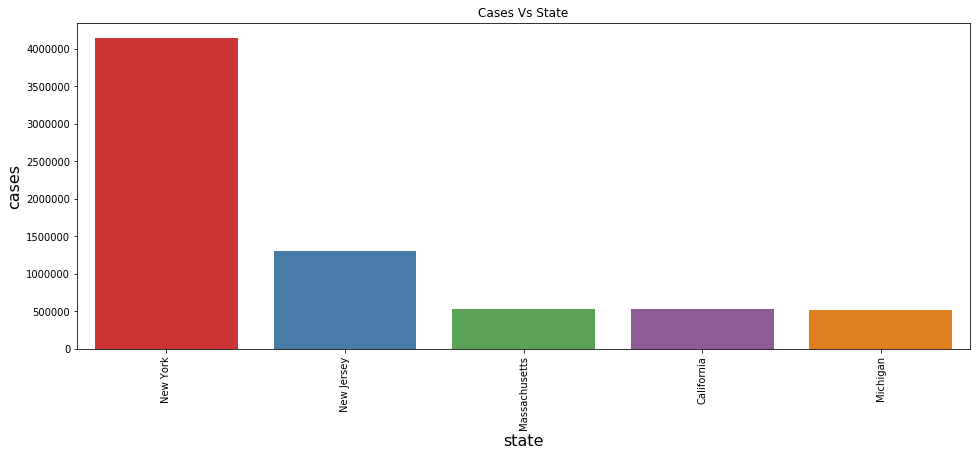

In [664]:
# Barplot of total number of cases each state has.
# So x axis is state and y axis is total number of cases.
groupbystatecases = groupbystatecases.reset_index()
fig, ax = plt.subplots(figsize=(16,6))
sns.barplot(x="state" , y = "cases" ,data =groupbystatecases.head(5), palette='Set1').set_title("Cases Vs State")
ax.xaxis.label.set_fontsize(16)
ax.yaxis.label.set_fontsize(16)
plt.xticks(rotation=90)
plt.show()

Again observed New York comes at first.

> # Most deaths by State

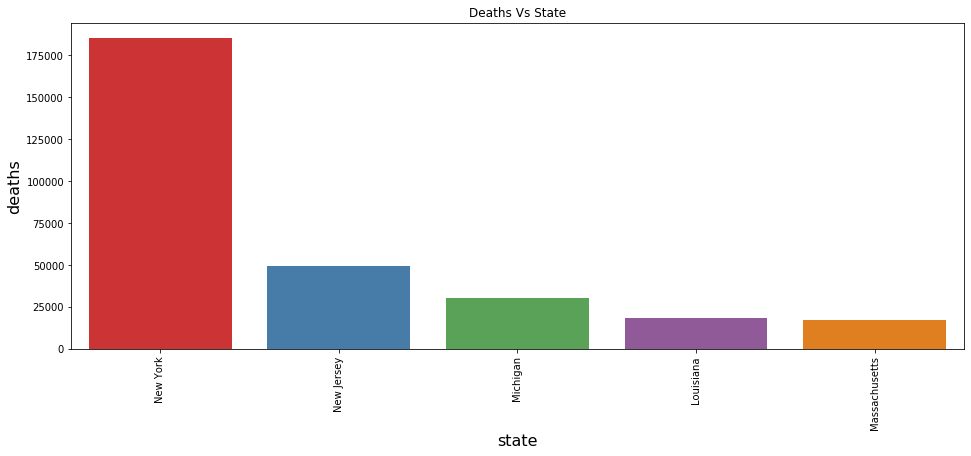

In [665]:
# Barplot of total number of deaths each state has.
# So x axis is state and y axis is total number of deaths.
groupbystatedeath = groupbystatedeath.reset_index()
fig, ax = plt.subplots(figsize=(16,6))
sns.barplot(x="state" , y = "deaths" ,data =groupbystatedeath.head(5), palette='Set1').set_title("Deaths Vs State")
ax.xaxis.label.set_fontsize(16)
ax.yaxis.label.set_fontsize(16)
plt.xticks(rotation=90)
plt.show()

Again observed New York state has maximum no of deaths.

In [666]:
# Overall total number of deaths. To analye how many deaths have happen till the last date.
covid_19_USA.deaths.sum()

462741

> Mean, Min , Max of number of Deaths in United States Grouped By date

>Group by date means total number of deaths on each date.
>So this will help us to see on each date what is the minimum number of deaths and what is the maximum number of deaths.
>Also mean of number of deaths on each date.

In [667]:
# Group by Deaths
df = covid_19_USA.groupby('date').agg({'deaths': ['mean', 'min', 'max']})
df.tail(10)

deaths           
                  mean min    max
date                             
2020-04-12  393.839286   0   9385
2020-04-13  421.535714   0  10056
2020-04-14  465.714286   0  10834
2020-04-15  510.392857   0  11586
2020-04-16  548.625000   0  12192
2020-04-17  587.678571   0  12822
2020-04-18  620.107143   0  13362
2020-04-19  644.803571   0  13869
2020-04-20  674.910714   0  14347
2020-04-21  719.928571   0  14828

### Observation : Since maximum number of deaths is increasing datewise. It means number of deaths is increasing each day.

>Mean, Min , Max of total number of Cases in United States Grouped By date

Group by date means total number of cases on each date. So this will help us to see on each date what is the minimum number of cases and what is the maximum number of cases. Also mean of number of cases on each date.

In [668]:
# Group by Cases 
dfc = covid_19_USA.groupby('date').agg({'cases': ['mean', 'min', 'max']})
dfc.tail(10)

cases            
                    mean min     max
date                                
2020-04-12   9916.553571   0  188694
2020-04-13  10372.375000   0  195031
2020-04-14  10844.375000   0  202208
2020-04-15  11376.000000   0  213779
2020-04-16  11938.089286   0  222284
2020-04-17  12497.375000   0  229642
2020-04-18  13001.678571   0  236763
2020-04-19  13452.035714   0  242817
2020-04-20  13936.589286   0  247543
2020-04-21  14388.767857   0  251720

### Observation : Since maximum number of cases is increasing datewise. It means number of cases is increasing each day.

> ## Barplot - Death-toll in all States in US

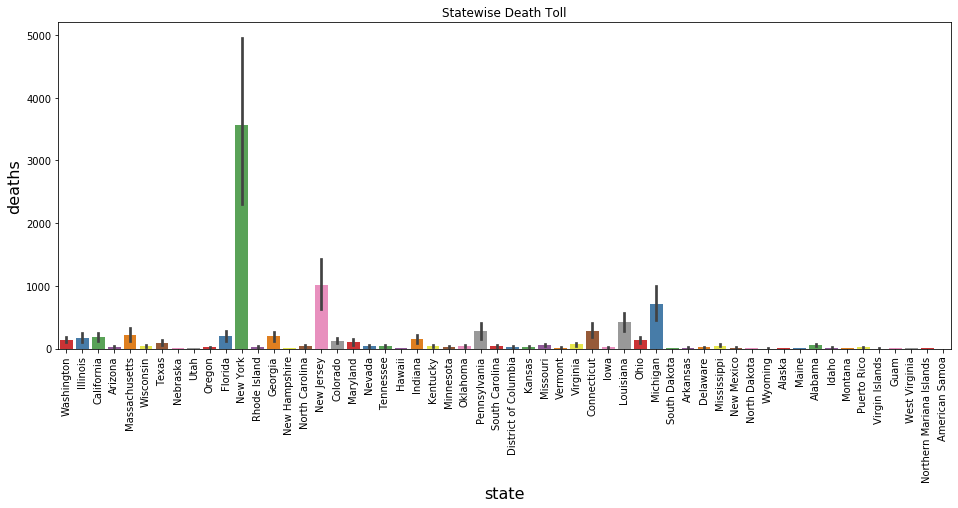

In [669]:
# plot of statewise number of deaths
fig, ax = plt.subplots(figsize=(16,6))
sns.barplot(x="state" , y = "deaths" ,data =covid_19_USA , palette='Set1').set_title("Statewise Death Toll")
ax.xaxis.label.set_fontsize(16)
ax.yaxis.label.set_fontsize(16)
plt.xticks(rotation=90)
plt.show()

Observation : 
1. Almost all states are affected by the disease and have positive cases as well as death cases
2. NewYork being the highest

> Least affected states

In [670]:
statedata = covid_19_USA.groupby('state').sum()
statedata.loc[(statedata['deaths']<50) & (statedata['cases'] < 500)]

,fips,cases,deaths
state,,,
American Samoa,780,0,0
Northern Mariana Islands,1725,237,36


> ## Plotting of rise in cases in US

In [671]:
tempdata = covid19usconfirmed.loc[:,'1/22/20':]
tempdata = tempdata.T
tempdata = pd.DataFrame(tempdata.sum(axis=1))
tempdata.columns = ["cases"]
tempdata.head()

,cases
1/22/20,1
1/23/20,1
1/24/20,2
1/25/20,2
1/26/20,5


In [672]:
# total cases
tempdata.iloc[-1:]

,cases
4/21/20,823786


> Histogram representation of Cases

In [673]:
# data
histogram_data = tempdata.iloc[40:].values
histogram_data = histogram_data.flatten()

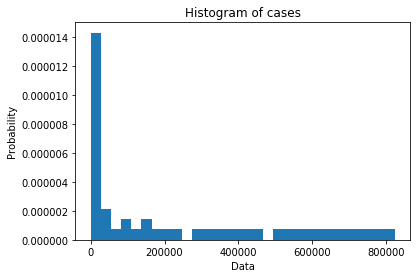

In [674]:
# plotting histogram
plt.hist(histogram_data, density=True, bins=30)
plt.ylabel('Probability')
plt.xlabel('Data')
plt.title("Histogram of cases")
plt.show()

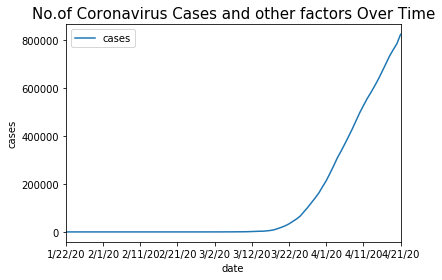

In [675]:
tempdata.plot()
plt.title('No.of Coronavirus Cases and other factors Over Time', size=15)
plt.xlabel('date')
plt.ylabel('cases')
plt.show()

Observation : We can see that there is an exponential growth ( what it means is that every day the number of cases are being multiplied by a constant which tends to be a multiple of *1.2-1.3* )

> ### Lets check it on a Logarithmic Scale Curve
Reason:  
1. Logscale responds to skewness towards large values
2. To have a better idea of percent change in the cases

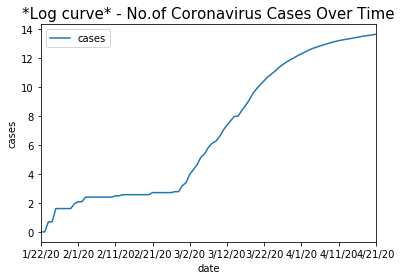

In [676]:
#data
tempdata_2 = tempdata.apply(lambda x :np.log(x))

#plot
tempdata_2.plot()
plt.title('*Log curve* - No.of Coronavirus Cases Over Time', size=15)
plt.xlabel('date')
plt.ylabel('cases')
plt.show()

### Observation : Number of cases are not just increasing but it is increasing exponentially. 

> # Now lets check the Growth Rate
The formula for the growth rate :
$$ Growth rate= \frac{N(d)}{N(d-1)}   $$
where, **N(d)** is cases on a specific day and **N(d-1)** is cases on the previous day


In [677]:
# Adding changes column
tempdata["Changes"] = tempdata["cases"] - tempdata["cases"].shift(1)

# adding growth factor column
tempdata["Growth Change"] = tempdata["Changes"] - tempdata["Changes"].shift(1)

# Growth Factor or Ratio
tempdata["Growth Factor"] = tempdata["Changes"] / tempdata["Changes"].shift(1)

# EP Factor
tempdata["EP Factor"] = tempdata["Growth Factor"]-1

# fillinG NaN value with 0 
tempdata.fillna(0,inplace=True)
tempdata = tempdata.replace(np.inf, 0)
tempdata.tail(20)

,cases,Changes,Growth Change,Growth Factor,EP Factor
4/2/20,243762,30390.0,5190.0,1.205952,0.205952
4/3/20,275586,31824.0,1434.0,1.047187,0.047187
4/4/20,308853,33267.0,1443.0,1.045343,0.045343
4/5/20,337072,28219.0,-5048.0,0.848258,-0.151742
4/6/20,366667,29595.0,1376.0,1.048761,0.048761
4/7/20,397505,30838.0,1243.0,1.042000,0.042000
4/8/20,429052,31547.0,709.0,1.022991,0.022991
4/9/20,462780,33728.0,2181.0,1.069135,0.069135
4/10/20,496535,33755.0,27.0,1.000801,0.000801
4/11/20,526396,29861.0,-3894.0,0.884639,-0.115361


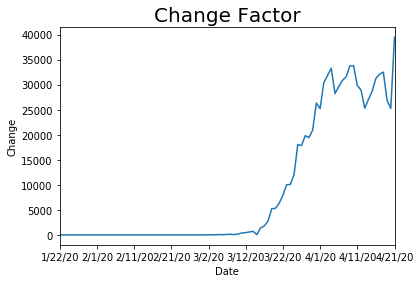

In [678]:
#Plotting the Changes
tempdata["Changes"].plot()
plt.title('Change Factor', size=20)
plt.xlabel('Date')
plt.ylabel('Change')
plt.show()

In [679]:
# Maximun Growth rate
tempdata["Growth Factor"].max()

22.770491803278688

In [680]:
# Maximum Growth details
tempdata[tempdata["Growth Factor"]==tempdata["Growth Factor"].max()]

,cases,Changes,Growth Change,Growth Factor,EP Factor
3/16/20,4307,1389.0,1328.0,22.770492,21.770492


>> Observation: On 16th March 2019 we experienced the fastest growth or rise in cases in United States

In [681]:
# The Growht Factor of Cases in United states is: 
tempdata["Growth Factor"].mean()

0.9479992446162356

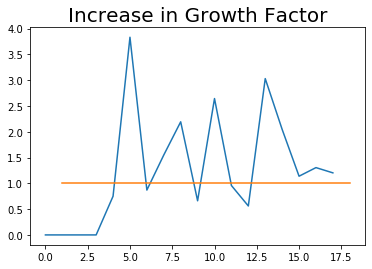

In [682]:
# a staright line at Growth Rate=1
x_coordinates = [1, 18]
y_coordinates = [1, 1]

#removing the zeros
plt.plot(tempdata["Growth Factor"].iloc[35:53].values)
plt.plot(x_coordinates, y_coordinates)
plt.title('Increase in Growth Factor', size=20)
plt.show()

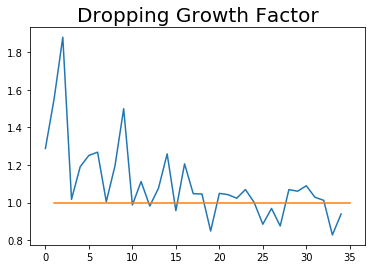

In [683]:
x_coordinates = [1, 35
                ]
y_coordinates = [1, 1]


#removing the zeros
plt.plot(tempdata["Growth Factor"].iloc[55:90].values)
plt.title('Dropping Growth Factor', size=20)
plt.plot(x_coordinates , y_coordinates)
plt.show()

In [684]:
#finding mean of last 20 days value
tempdata["Growth Factor"].iloc[75:].mean()

1.0312278045781555

>> Slope is now dropping to almost 1, hence we have reached the inflection point

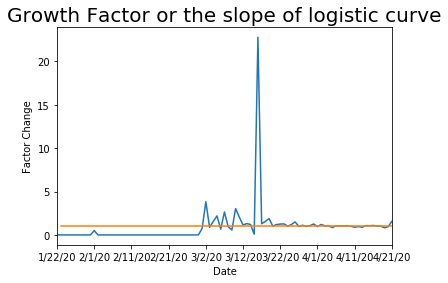

In [685]:
x_coordinates = [1, 90]
y_coordinates = [1, 1]

# Plotting the Growth Factor
tempdata["Growth Factor"].plot()
plt.plot(x_coordinates, y_coordinates)
plt.title('Growth Factor or the slope of logistic curve', size=20)
plt.xlabel('Date')
plt.ylabel('Factor Change')
plt.show()

Observation: 
*What does this mean ???*  
*Basic Mathematics concept of Slopes*
1. if slope < 1:   
Then we have crossed the exponential growth 
2. if slope >1:  
Then we are still at the exponential growth 
3. If the Slope == 1 :  
It could mean that we are at the "Inflection point"-(Mid point of logistic growth)  
Which could further mean that the total number of cases are going to last out 2 times the number of cases currently


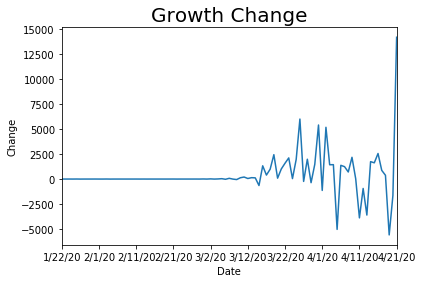

In [686]:
#Plotting the Growth Change
tempdata["Growth Change"].plot()
plt.title('Growth Change', size=20)
plt.xlabel('Date')
plt.ylabel('Change')
plt.show()

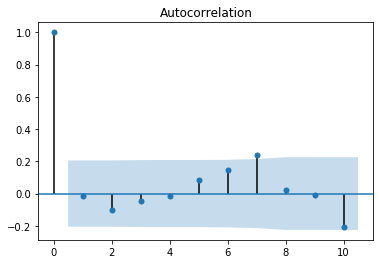

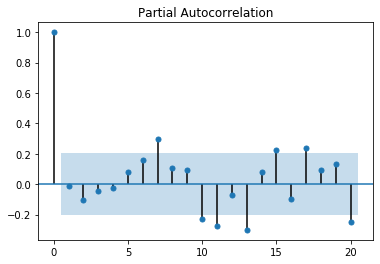

In [687]:
plot_acf(tempdata["Growth Change"],lags=10)
plt.show()
plot_pacf(tempdata["Growth Change"])
plt.show()

Observation:  
1. There is not a continuous growth, there are drops and rise, which is nothing but the noise for the model. Or in reality we can say that there are some other factos that influence the growth and drop of the cases
2. We observed that the growth factor is coming to 0, which means that we are almost at the inflection point, which also means that according to this model the total number of cases will be 2x the current cases


<center>
<img src="images/inflectionpoint.png" width=600 />
</center>

Every new thing thats interesting follows a logistic curve  
Chinas graph followed logistic curve and I believe that USA will follow the logistic curve as well
1. example - When people adopt a new technology, the market follows the pattern of a logistic function  
sources:
1. [TowardsDataScience](https://towardsdatascience.com/real-world-implementation-of-logistic-regression-5136cefb8125)
2. [Medium](https://medium.com/analytics-vidhya/predicting-the-spread-of-covid-19-coronavirus-in-us-daily-updates-4de238ad8c26)
3. Pierre-François Verhulst formulated logistic function in 1838 to describe the self-limiting growth of a biological population


<center>
Ohh my god!! We found something interesting
<img src="images/tyrionisshocked.jpg" width=500 />
</center>

> ## Plotting the rise of cases and deaths in US

In [688]:
CDR.head()

,ObservationDate,Province/State,Country/Region,Confirmed,Deaths,Recovered
0,01/22/2020,Washington,US,1.0,0.0,0.0
1,01/23/2020,Washington,US,1.0,0.0,0.0
2,01/24/2020,Washington,US,1.0,0.0,0.0
3,01/24/2020,Chicago,US,1.0,0.0,0.0
4,01/25/2020,Washington,US,1.0,0.0,0.0


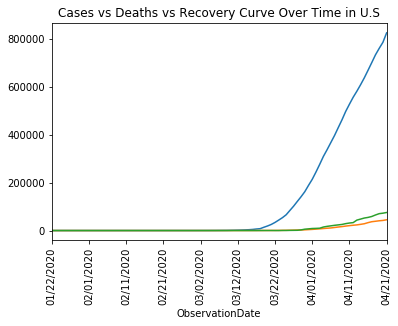

In [689]:
# Summing the data deatewise so we have total number of cases,total number of deaths and total number of recovered cases on each date
CDR_data = CDR.groupby(["ObservationDate"]).sum()
# plotting total number of confirmed cases,deaths and recovered cases on each date
CDR_data.Confirmed.plot()
CDR_data.Deaths.plot()
CDR_data.Recovered.plot()
plt.xticks(rotation=90)
plt.title('Cases vs Deaths vs Recovery Curve Over Time in U.S', size=12)
plt.show()

In [690]:
# sum  data on each date
casendeath=covid_19_USA.groupby(["date"]).sum()
# so now we have total number of cases and deaths on each date
casendeath.head()

,fips,cases,deaths
date,,,
2020-01-21,53,1,0
2020-01-22,53,1,0
2020-01-23,53,1,0
2020-01-24,70,2,0
2020-01-25,76,3,0


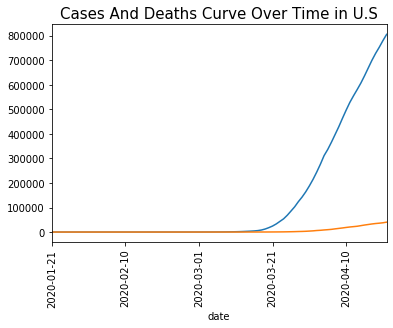

In [691]:
# plotting bothcases and deaths with time 
casendeath.cases.plot()
casendeath.deaths.plot()
plt.xticks(rotation=90)
plt.title('Cases And Deaths Curve Over Time in U.S', size=15)
plt.show()

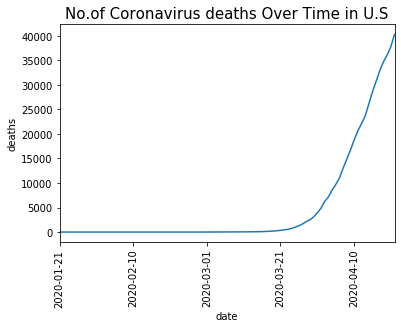

In [692]:
# the rise in deaths with time
casendeath.deaths.plot()
plt.title('No.of Coronavirus deaths Over Time in U.S', size=15)
plt.xlabel('date')
plt.ylabel('deaths')
plt.xticks(rotation=90)
plt.show()

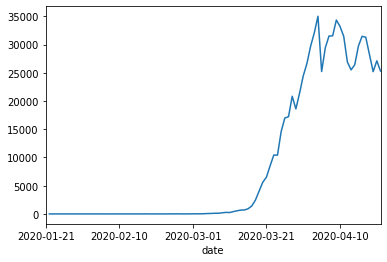

In [693]:
# using.diff() to plot the difference
modelling_data1 = covid_19_USA.groupby(["date"]).sum()
modelling_data1["cases"].diff().plot()
plt.show()

> # Population & density - statewise

In [694]:
#data
statepop=usstate[1:]
statepop.drop(["FIPS","Area_Name"],axis=1,inplace=True)
statedensity=statepop.groupby("State").sum()
statedensity.reset_index(inplace=True)
# statedensity

C:\Users\Abhishek\Anaconda3\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



> ## Barplot for Population Statewise

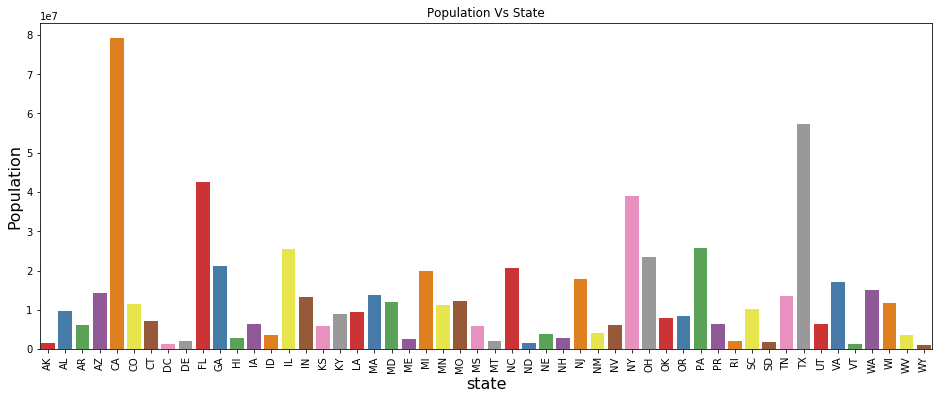

In [695]:
fig, ax = plt.subplots(figsize=(16,6))
sns.barplot(x="State" , y = "POP_ESTIMATE_2018" ,data =statedensity , palette='Set1').set_title("Population Vs State")
ax.xaxis.label.set_fontsize(16)
ax.yaxis.label.set_fontsize(16)
ax.set_xlabel('state') 
ax.set_ylabel("Population") 
plt.xticks(rotation=90)
plt.show()

> # Plotting population-cases-death

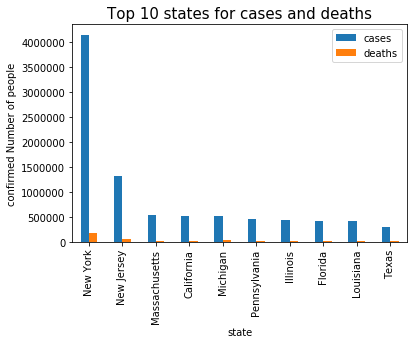

In [696]:
# countylevel data
alldata = covid_19_USA.groupby(["state"]).sum()
alldata.reset_index(inplace=True)
confirmdeath=alldata.sort_values(by="cases",ascending=False)
confirmdeath=confirmdeath.head(10)

#plot
confirmdeath.plot(x="state", y=["cases", "deaths"], kind="bar")
plt.title('Top 10 states for cases and deaths', size=15)
plt.xlabel('state')
plt.ylabel('confirmed Number of people')
plt.show()

> ## Mortality Rate State Wise

In [697]:
statewise = covid_19_USA.groupby('state').sum()
statewise = statewise.sort_values(by="cases",ascending=False)
statewise["Mortality Rate"] = np.round(100*statewise["deaths"]/statewise["cases"],2)
statewise.style.background_gradient(cmap='Reds',subset=["deaths"])\
                        .background_gradient(cmap='Purples',subset=["cases"])\
                        .background_gradient(cmap='YlOrBr',subset=["Mortality Rate"])

C:\Users\Abhishek\Anaconda3\lib\site-packages\matplotlib\colors.py:527: RuntimeWarning:

invalid value encountered in less



,fips,cases,deaths,Mortality Rate
state,,,,
New York,1872,4142555,185207,4.47
New Jersey,1666,1306598,49539,3.79
Massachusetts,2025,526690,17442,3.31
California,528,525080,15576,2.97
Michigan,1118,516637,30580,5.92
Pennsylvania,1974,463353,12825,2.77
Illinois,1513,440937,15479,3.51
Florida,624,424088,10157,2.4
Louisiana,968,413638,18492,4.47


> paralle plotting

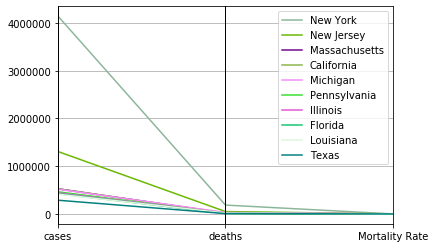

In [698]:
# data
statewise_2=statewise.reset_index()
statewise_2=statewise_2.drop(["fips"],axis=1)

# costatewise_2de
parallel_coordinates(statewise_2.head(10), "state")
plt.show()

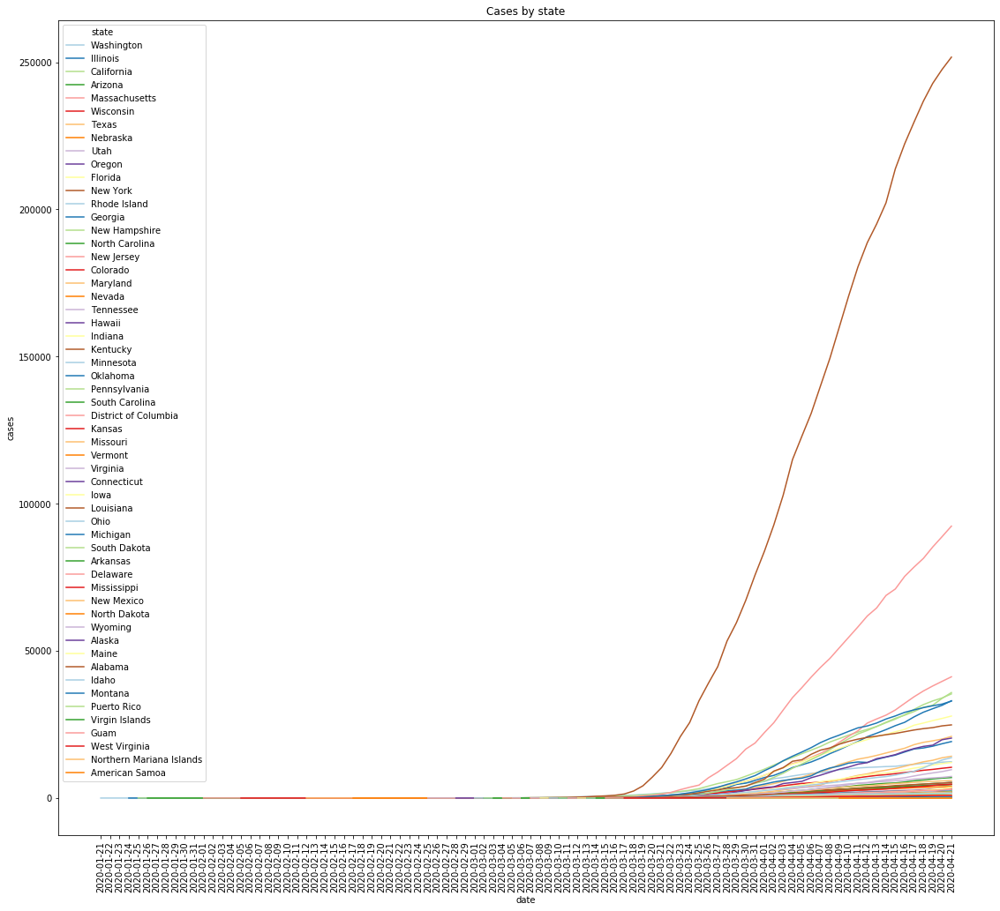

In [699]:
plt.figure(figsize=(19,17))
plt.title('Cases by state') # Title
sns.lineplot(x="date", y="cases", hue="state",data=covid_19_USA, palette="Paired")
plt.xticks(covid_19_USA.date.unique(), rotation=90) # All values in the x axis rotate 90 degrees
plt.show()

> ## Data Exploration

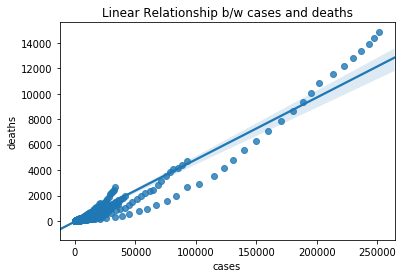

In [700]:
# Checking linear relationships
sns.regplot(covid_19_USA['cases'],covid_19_USA['deaths']).set_title('Linear Relationship b/w cases and deaths')
plt.show()

>> Observation : There is a linear relationshio between Cases and death. As the cases increase the deaths are also increasing

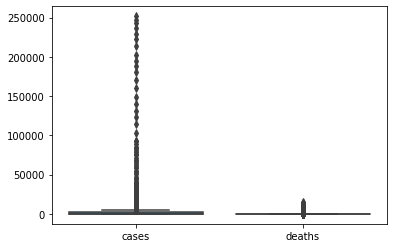

In [701]:
# boxplots
box_data=pd.DataFrame(covid_19_USA[["cases","deaths"]])
sns.boxplot(data=box_data)
plt.show()

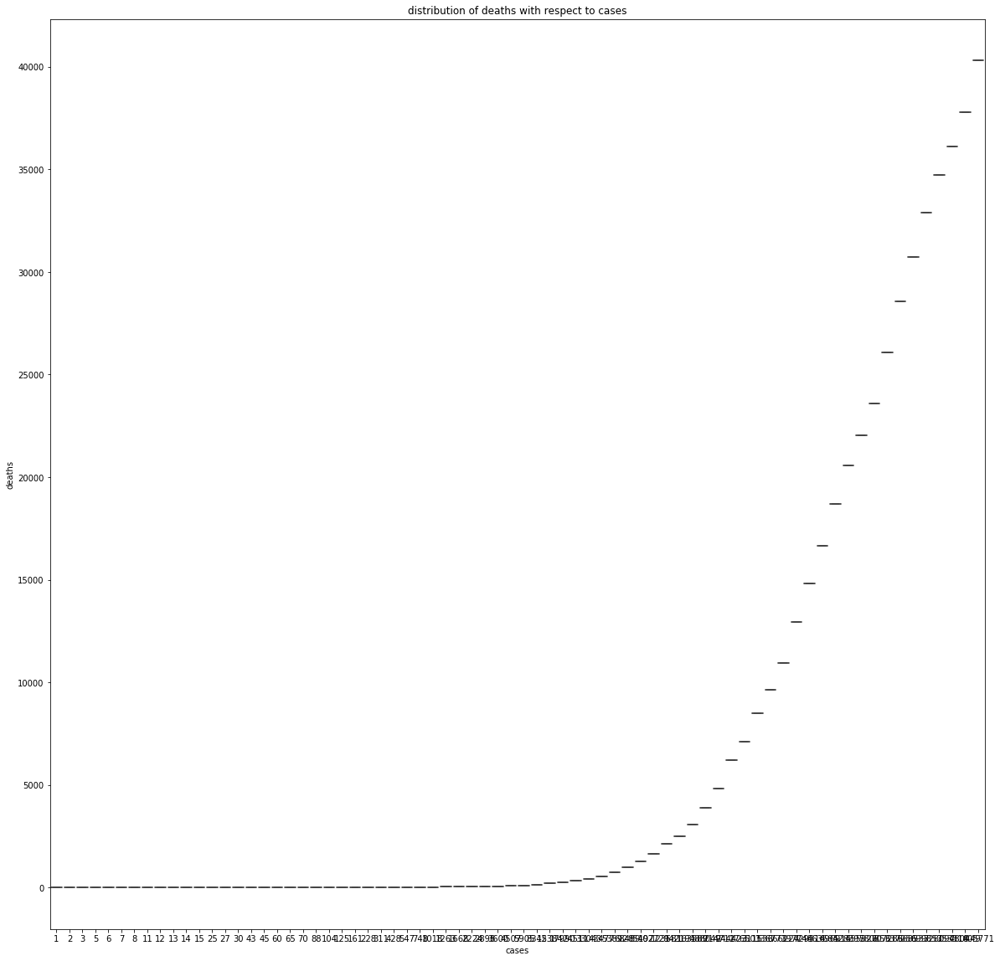

In [702]:
#Boxplot

#data
boxdata = covid_19_USA.groupby(["date"]).sum()
boxdata.drop(["fips"],axis=1,inplace=True)
boxdata.reset_index(inplace=True)

#plotting
data_temp = pd.concat([boxdata['deaths'], boxdata["cases"]], axis=1)
plt.subplots(figsize=(20, 20))
sns.boxplot(x="cases", y="deaths", data=data_temp).set_title("distribution of deaths with respect to cases")
plt.show()

# Plotting No.of Cases state 

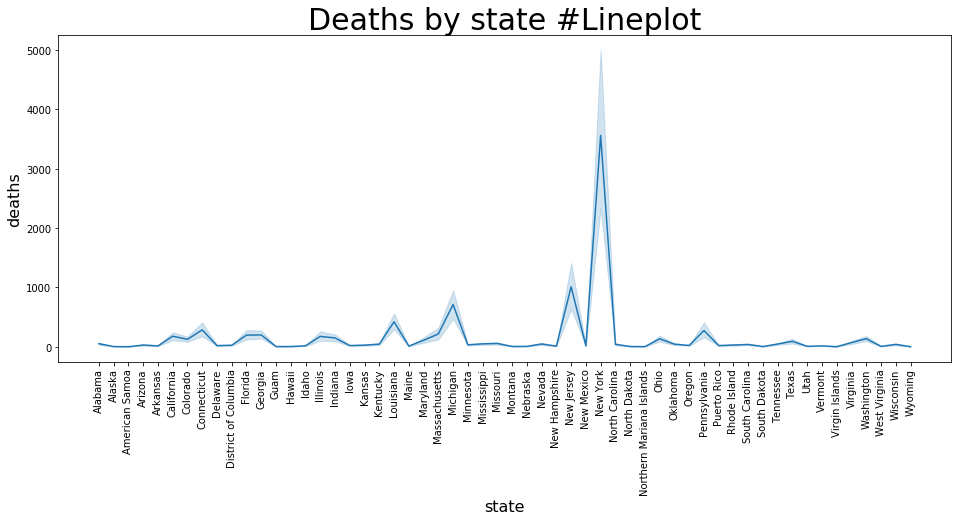

In [703]:
# Lineplots
fig, ax = plt.subplots(figsize=(16,6))
sns.lineplot(x="state" , y = "deaths" ,data =covid_19_USA , palette='Set1')
ax.xaxis.label.set_fontsize(16)
ax.yaxis.label.set_fontsize(16)
plt.xticks(rotation=90)
plt.title('Deaths by state #Lineplot', size=30)
plt.show()

In [704]:
#data countywise
countywise=nytimes_county.groupby(["county"]).sum()
countywise.reset_index(inplace=True)
countywise.sort_values(by="cases",ascending=False,inplace=True)

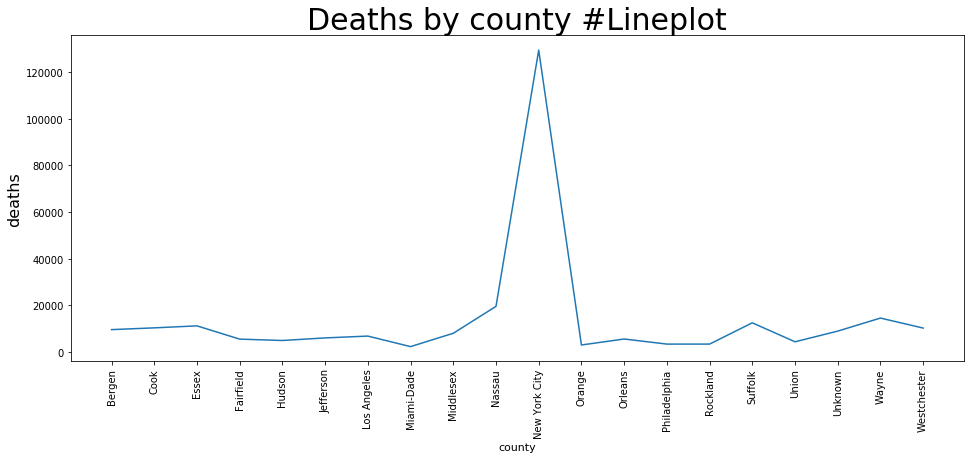

In [705]:
# Line Plots
fig, ax = plt.subplots(figsize=(16,6))
sns.lineplot(x="county" , y = "deaths" ,data =countywise.head(20) , palette='Set1' )
ax.xaxis.label.set_fontsize(11)
ax.yaxis.label.set_fontsize(16)
plt.xticks(rotation=90)
plt.title('Deaths by county #Lineplot', size=30)
plt.show()

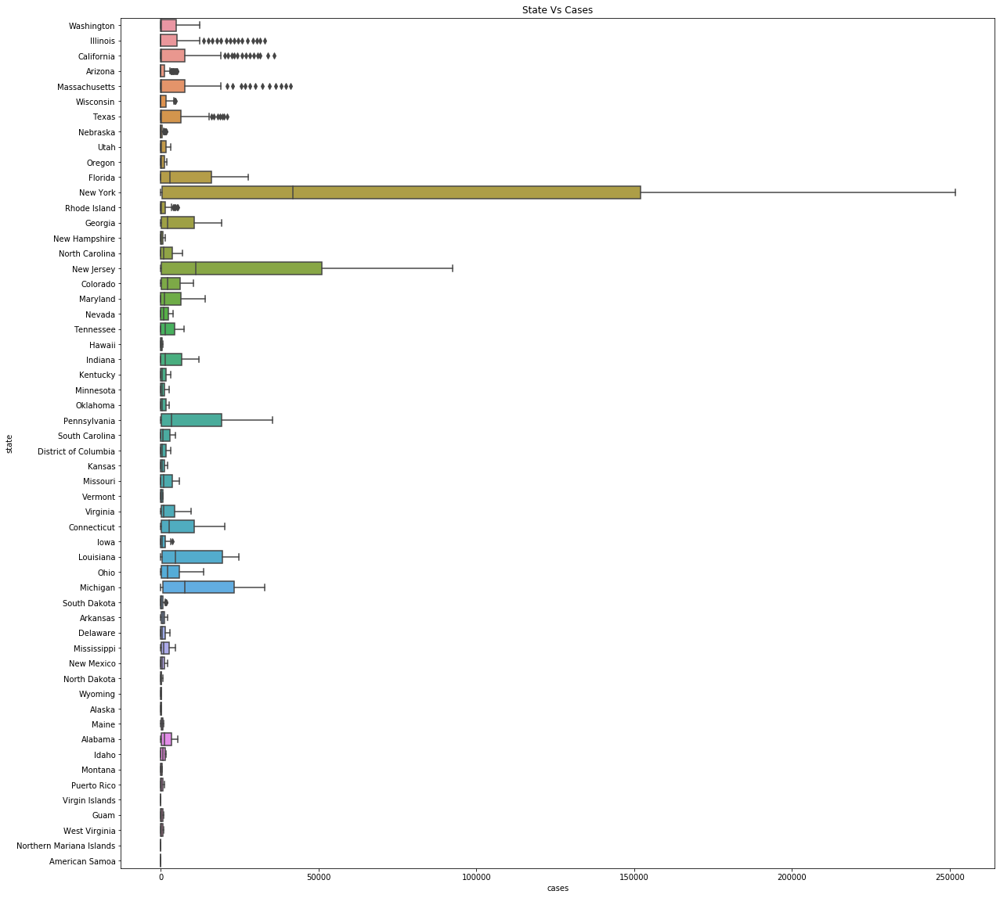

In [706]:
# Boxplot for Cases in All States
data_temp = pd.concat([covid_19_USA['state'], covid_19_USA["cases"]], axis=1)
f, ax = plt.subplots(figsize=(20, 20))
fig = sns.boxplot(x="cases", y="state", data=data_temp).set_title("State Vs Cases")
plt.show()

> ## Check the Statewise growth in Cases

In [707]:
statedatedata=pd.concat([covid19usconfirmed[["Province_State"]],covid19usconfirmed.loc[:,'3/18/20':]],axis=1)
statedatedata=statedatedata.groupby(["Province_State"]).sum()
statedatedata.style.background_gradient(cmap='Reds',subset=["4/3/20"])\
                        .background_gradient(cmap='Purples',subset=["4/2/20"])\
                        .background_gradient(cmap='YlOrBr',subset=["4/1/20"])\
                        .background_gradient(cmap='Purples',subset=["3/31/20"])\
                        .background_gradient(cmap='YlOrBr',subset=["3/30/20"])\
                        .background_gradient(cmap='Purples',subset=["3/29/20"])\
                        .background_gradient(cmap='YlOrBr',subset=["3/28/20"])\
                        .background_gradient(cmap='Purples',subset=["3/27/20"])\
                        .background_gradient(cmap='YlOrBr',subset=["3/26/20"])\
                        .background_gradient(cmap='Purples',subset=["3/25/20"])\
                        .background_gradient(cmap='YlOrBr',subset=["3/24/20"])\
                        .background_gradient(cmap='Purples',subset=["3/23/20"])\
                        .background_gradient(cmap='YlOrBr',subset=["3/22/20"])\
                        .background_gradient(cmap='YlOrBr',subset=["3/21/20"])\
                        .background_gradient(cmap='Purples',subset=["3/20/20"])\
                        .background_gradient(cmap='YlOrBr',subset=["3/19/20"])\
                        .background_gradient(cmap='Purples',subset=["3/18/20"])

,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20
Province_State,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Alabama,51,78,106,131,157,196,242,381,517,587,694,825,899,987,1060,1233,1495,1614,1765,1952,2169,2328,2703,2947,3217,3563,3734,3953,4075,4345,4571,4712,4888,5079,5317
Alaska,5,8,11,13,18,30,34,41,56,58,85,102,114,119,132,143,157,171,185,190,213,226,235,246,257,272,277,285,293,300,309,314,319,321,329
American Samoa,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Arizona,27,45,68,104,152,235,326,401,508,665,773,919,1157,1289,1530,1715,1937,2187,2486,2732,2870,3036,3018,3112,3393,3542,3705,3809,3964,4237,4511,4724,4933,5068,5256
Arkansas,4,62,100,122,165,192,219,280,335,381,409,426,473,523,584,643,704,743,837,875,946,1000,1119,1171,1228,1280,1410,1498,1569,1620,1695,1744,1781,1973,1990
California,828,1005,1243,1405,1646,2108,2538,2998,3899,4657,5095,5852,7138,8210,9399,10773,12004,12837,15034,16019,17351,18897,19710,21081,21706,22795,23931,25356,26686,27677,29157,30491,31431,33686,35465
Colorado,218,277,363,475,591,704,723,1021,1430,1433,1740,2307,2311,2966,2982,3342,3742,4188,4950,5183,5429,5655,5655,6202,6513,7307,7691,7950,7956,8286,8691,9047,9730,9730,10473
Connecticut,96,159,194,194,327,415,618,875,1012,1291,1524,1993,2571,3128,3557,3824,4914,5276,5675,6906,7781,7781,9784,10538,11510,12035,13381,13989,14755,15884,16809,17550,17962,19815,20360
Delaware,19,30,39,45,56,68,104,119,130,163,214,232,264,319,368,393,450,593,673,783,928,1116,1209,1326,1479,1625,1758,1926,2014,2070,2317,2538,2538,2745,2931


>> Observation: 
We can see that Every day "NEW YORK" is on the top list of confirmed cases amongst all other states in US

> # Map representation

In [708]:
# Data Set for Map
datessum=covid19usconfirmed.loc[:,'1/22/20':]
datessum=pd.DataFrame(datessum.sum(axis=1))
datessum.columns=["Cases"]
dfdf=covid19usconfirmed[["Province_State","Lat","Long_"]]
confirmednew=pd.concat([dfdf,datessum],axis=1)
confirmednew = confirmednew.dropna()
confirmednew.tail(5)

,Province_State,Lat,Long_,Cases
3264,US Military,0.0,0.0,253
3265,US Military,0.0,0.0,1631
3266,Federal Bureau of Prisons,0.0,0.0,319
3267,US Military,0.0,0.0,1810
3268,Veteran Hospitals,0.0,0.0,5599


> ### Using Folium for installing US Map  
loading the US Map from folium with Lat and Long

In [709]:
# setting longitute and latitude for United States
latitude = 37.0902
longitude = -95.7129
m = folium.Map(location=[latitude, longitude],zoom_start=4)

> # MAP 1

In [710]:
for i in range(0,len(confirmednew)):
    folium.Circle([confirmednew.iloc[i]['Lat'], confirmednew.iloc[i]['Long_']],
                      tooltip =('RegionName: ' + str(confirmednew.iloc[i]['Province_State']) + '<br>'
                    'TotalPositiveCases: ' + str(confirmednew.iloc[i]['Cases']) + '<br>'),
                    radius=5,
                    color='#ff6600',
                    fill_color='#ff8533',
                    fill=True).add_to(m)
m

In [711]:
colordict={}
for i in range(0, 10):
    colordict[i]='lightgreen'
for i in range(10, 100):
    colordict[i]='yellow'
for i in range(100, 1000):
    colordict[i]='orange'
for i in range(1000, 20000000):
    colordict[i]='red'
# colordict

> # MAP - Intensity of Impact

In [712]:
for lat, lon, Province_State, Cases in zip(confirmednew['Lat'], confirmednew['Long_'], confirmednew['Province_State'], confirmednew['Cases']):
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup = ('Province_State: ' + str(Province_State).capitalize() + '<br>'
                 'Cases: ' + str(Cases) + '<br>'),
        color='b',
        key_on = Cases,
        threshold_scale=[0,1],
        fill_color=colordict[Cases], #'red', #
        fill=True,
        fill_opacity=0.5
        ).add_to(m)
m

> Clustering of cities according to Cases, Deaths and recovery
#### K-means for clustering 
Clustering is used by alot of countries to figure out the similar patterns 
1. https://arxiv.org/ftp/arxiv/papers/2002/2002.07112.pdf
2. https://www.medrxiv.org/content/10.1101/2020.04.07.20056739v1.full.pdf

In [713]:
# data
custering_data = CDR.groupby(["Province/State"]).sum()
clusterdata=custering_data[["Confirmed","Recovered","Deaths"]]

In [714]:
kmeand_model=KMeans(n_clusters=6,init='k-means++',random_state=42)
kmeand_model.fit(clusterdata)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=6, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

In [715]:
clusterdata["Clusters"]=kmeand_model.predict(clusterdata)

C:\Users\Abhishek\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



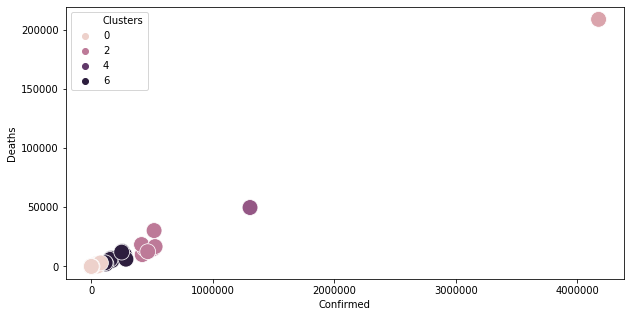

In [716]:
plt.figure(figsize=(10,5))
sns.scatterplot(x=clusterdata["Confirmed"],y=clusterdata["Deaths"],hue=clusterdata["Clusters"],s=250)

In [717]:
labels = kmeand_model.labels_
print(Counter(labels))

Counter({0: 181, 5: 11, 2: 7, 3: 1, 1: 1, 4: 1})


# --} Model and Prediction

<center>
Ohh my god!!! there are soo many models!!!
<img src="images/modelsoninternet.jpg" width=500 />
</center>

## Prediction for early stages of Covid 19

> #### 1.  Arima Model

In [718]:
model = ARIMA(casendeath['cases'].values, order=(1, 2, 1))
fit_model = model.fit(trend='c', full_output=True, disp=True)
fit_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                   D2.y   No. Observations:                   90
Model:                 ARIMA(1, 2, 1)   Log Likelihood                -801.370
Method:                       css-mle   S.D. of innovations           1781.078
Date:                Thu, 23 Apr 2020   AIC                           1610.741
Time:                        22:47:50   BIC                           1620.740
Sample:                             2   HQIC                          1614.773
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        251.3867    264.953      0.949      0.345    -267.911     770.684
ar.L1.D2.y     0.8971      0.112      8.001      0.000       0.677       1.117
ma.L1.D2.y    -0.8525      0.123     -6.933      0.000      -1.094      -0.612
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.1148           +0.0000j            1.1148            0.0000
MA.1            1.1730           +0.0000j            1.1730            0.0000
-----------------------------------------------------------------------------
"""

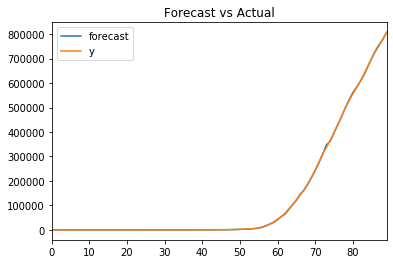

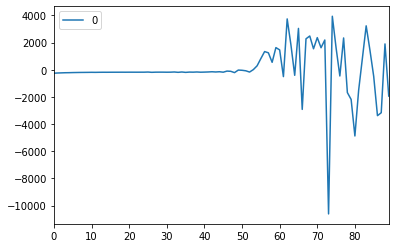

In [719]:
fit_model.plot_predict()
plt.title('Forecast vs Actual')
pd.DataFrame(fit_model.resid).plot()
plt.show()

>> .resid graph shows the difference between the expected and the plotted prediction

In [720]:
temp_casendeath=casendeath.cases

In [721]:
newlength= np.arange(len(casendeath)+7).reshape(-1,1)
casendeath.index = pd.to_datetime(casendeath.index)
week = [casendeath.index[0] + timedelta(days=i) for i in range(len(newlength))]
# tempdates = pd.DatetimeIndex(week)

In [722]:
forcast = fit_model.forecast(steps=3)
pred_y = forcast[0].tolist()
pred_y=pd.DataFrame(pred_y)
pred_y.columns=["Future cases"]
pred_y

,Future cases
0,831142.195308
1,856583.399878
2,882113.285034


>> there might be a +/- of 5000 cases

> #### 2. Regression Model- MLPRegressor

In [723]:
# Data split
x = np.arange(len(casendeath)).reshape(-1, 1)
y = casendeath.cases.values

In [724]:
casendeath.index = pd.to_datetime(casendeath.index)

In [725]:
from sklearn.neural_network import MLPRegressor
model = MLPRegressor(hidden_layer_sizes=[32, 32, 10], max_iter=50000, alpha=0.0005, random_state=26)
_=model.fit(x, y)

In [726]:
test = np.arange(len(casendeath)+7).reshape(-1, 1)
pred = model.predict(test)
prediction = pred.round().astype(int)
week = [casendeath.index[0] + timedelta(days=i) for i in range(len(prediction))]
dt_idx = pd.DatetimeIndex(week)
predicted_count = pd.Series(prediction, dt_idx)

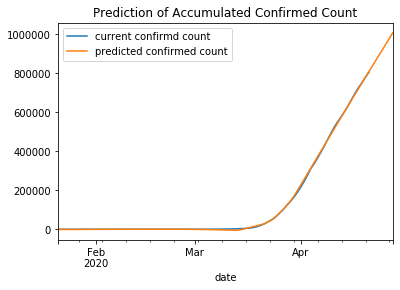

In [727]:
casendeath.cases.plot()
predicted_count.plot()
plt.title('Prediction of Accumulated Confirmed Count')
plt.legend(['current confirmd count', 'predicted confirmed count'])
plt.show()

> Logistic regression Model


In [728]:
# data
tempdata1= tempdata.reset_index(drop=True)
tempdata1.reset_index(inplace=True)
# tempdata1.iloc[:,1]

In [729]:
x = pd.DataFrame(tempdata1.iloc[:,0])
y = pd.DataFrame(tempdata1.iloc[:,1])

model = LogisticRegression(penalty='l2',solver='newton-cg',random_state=0)
model.fit(x,y)

C:\Users\Abhishek\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Abhishek\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=0, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

In [730]:
model.score(x,y)

0.31868131868131866

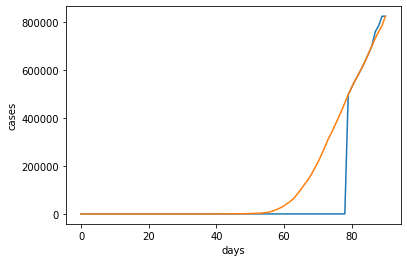

In [731]:
logresult=model.predict(x)
plt.plot(logresult)
plt.plot(x,y)
plt.xlabel("days")
plt.ylabel("cases")
plt.show()

>> Conclusion:it has 30% accuracy So this model does not fit!!

> ## logistic function and the exponential function

In [732]:
# data
tempdata_log=pd.DataFrame(tempdata1["cases"])
# data
tempdata_log.reset_index(drop=True,inplace=True)
tempdata_log.reset_index(inplace=True)

> ### Logistic Growth Model for COVID-19

1. The most generic formula for logistic curve is  
$$ E(Y) = \frac{c}{ 1+ exp^{-(x-b)/a}} $$

In [733]:
## x is the time 
## a refers to the infection speed
## b is the day with the maximum infections occurred
## c is the total number of recorded infected people at the infection’s end
def logistic_model(x,a,b,c):
    return c/(1+np.exp(-(x-b)/a))

In [734]:
# data
x = list(tempdata_log.iloc[:,0])
y = list(tempdata_log.iloc[:,1])

#model
fit = curve_fit(logistic_model,x,y,p0=[2,100,200000], maxfev=5000)
fit   

(array([6.21108734e+00, 7.75795122e+01, 8.92985804e+05]),
 array([[1.51571410e-02, 2.38762275e-02, 1.31547813e+03],
        [2.38762275e-02, 5.54333533e-02, 2.84592299e+03],
        [1.31547813e+03, 2.84592299e+03, 1.59481048e+08]]))

In [735]:
# the diagonal values are variance, hence we can sq root to find the standard errors
a,b,c =  [np.sqrt(fit[1][i][i]) for i in [0,1,2]]
a,b,c

(0.1231143410926678, 0.23544288762925566, 12628.580593165025)

In [736]:
sol = int(fsolve(lambda x : logistic_model(x,a,b,c) - int(c),b ))
sol

1

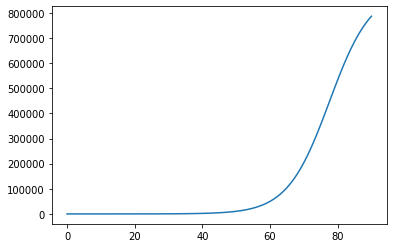

In [737]:
plt.plot(x,logistic_model(x,*fit[0]))

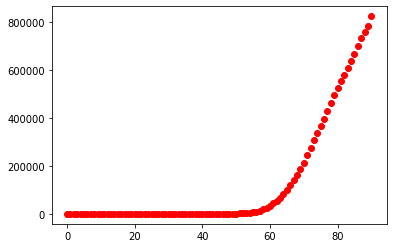

In [738]:
plt.scatter(x,y,label="Real data",color="red")

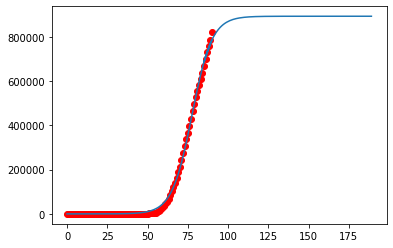

In [739]:
# comparision
pred_x =  list(range(85,190))
# pred_x =  list(range(max(x),sol))

# Real data
plt.scatter(x,y,label="Real data",color="red")

# Predicted logistic curve
plt.plot(x+pred_x, [logistic_model(i,fit[0][0],fit[0][1],fit[0][2]) for i in x+pred_x], label="Logistic model" )
# plt.plot(80,,linestyle='--')
plt.show()

In [740]:
errors = [np.sqrt(fit[1][i][i]) for i in [0,1,2]]
print(errors)

[0.1231143410926678, 0.23544288762925566, 12628.580593165025]


2. The Model proposed by researchers from TU Eindhoven in this notebook  

$$ E(Y) = \frac{c}{ 1+ exp^{-b(x-a)}} $$

with "c" the maximal number of cases,  
 a = sigmoid midpoint  
 b = curve steepness (logistic growth)  
 c = max value  


In [741]:
# data
x = list(tempdata1.iloc[:,0])
y = list(tempdata1.iloc[:,1])

In [742]:
# function to be minimized
# x is the timepoint
def f_sigmoid(x, a, b, c):
    return (c / (1 + np.exp(-b*(x-a))))

In [743]:
popt_sig, pcov_sig = curve_fit(f_sigmoid,x,y)    
popt_sig

array([7.75795058e+01, 1.61002704e-01, 8.92985312e+05])

In [744]:
a,b,c =  [np.sqrt(pcov_sig[i][i]) for i in [0,1,2]]
print("standard error of a,b,c is as follows")
a,b,c

standard error of a,b,c is as follows


(0.2354529963600017, 0.0031914026524912987, 12629.1333335806)

In [745]:
# this is inception + peak day
timedelta(days=int(popt_sig[0]))

datetime.timedelta(days=77)

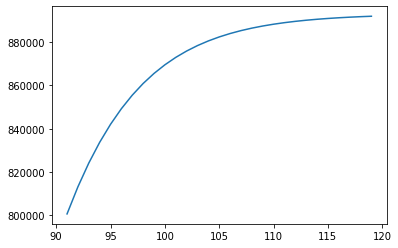

In [746]:
x_m=np.arange(len(x),120)
y_m= f_sigmoid(x_m, *popt_sig)
plt.plot(x_m,y_m)
plt.show()

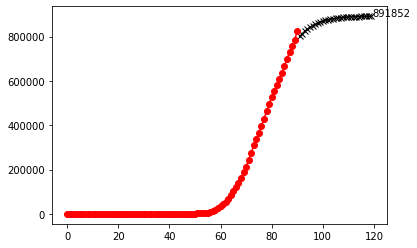

In [747]:
plt.plot(x_m, y_m, c='k', marker="x", label="sigmoid ") 
plt.text(x_m[-1]+.5, y_m[-1], str(int(y_m[-1])), size = 10)    
plt.plot(x, y, c='r', marker="o")
plt.show()

## Doesnt Look right still.....so lets combine the 2 models used above 

In [748]:
# function to be minimized

def f_sigmoid(x, a, b, c):
    return c / (1 + np.exp(-b*(x-a)))

In [749]:
fit_3 = curve_fit(f_sigmoid,x,y,p0=[2,100,200000],maxfev=5000)
fit 

(array([6.21108734e+00, 7.75795122e+01, 8.92985804e+05]),
 array([[1.51571410e-02, 2.38762275e-02, 1.31547813e+03],
        [2.38762275e-02, 5.54333533e-02, 2.84592299e+03],
        [1.31547813e+03, 2.84592299e+03, 1.59481048e+08]]))

In [750]:
print(*fit_3[0])

2.077105351377303 100.0 136262.0102472869


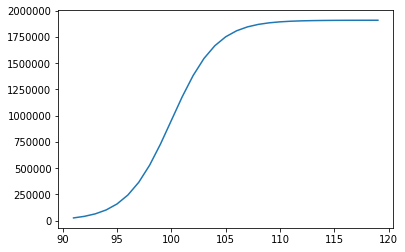

In [751]:
# logistic model
def logistic_model(x,a,b,c):
    return 14*c/(1+np.exp(-(x-b)/a))

x_new=np.arange(len(x),120)
plt.plot(x_new,logistic_model(x_new,*fit_3[0]))
plt.show()

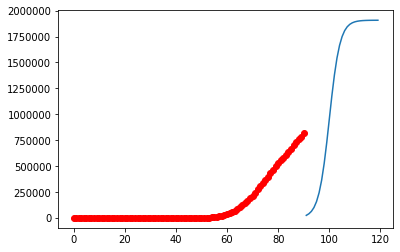

In [752]:
pred_x= np.arange(len(x),120)
# original plot
plt.scatter(x,y,label="Real data",color="red")
# Predicted logistic curve
plt.plot(pred_x, [logistic_model(i,*fit_3[0]) for i in pred_x], label="Logistic model" )
# plt.plot(80,,linestyle='--')
plt.show()

Covid19 will follow logistic growth overall as it has to come to an ends sometime,so this model gives us a better clue about the overall trajectory of cases in United States
#### Also confirms that the total cases effected would be 2x current cases

### Exponential Growth Model for Covid 19

 $$ f(x,a,b,c) = a.e^{b(x-c)}  $$

In [753]:
def exponential_growth(x,a,b,c):
    return a*np.exp(b*(x-c))

In [754]:
# x = list(tempdata1.iloc[:,0])
# y = list(tempdata1.iloc[:,1])

fit_4 = curve_fit(exponential_growth,x,y,p0=[1,1,1], maxfev=5000)
fit_4

(array([ 40.83537814,   0.07471691, -44.40274821]),
 array([[ 3.33873482e+15, -4.81691953e+04,  1.09427485e+15],
        [-4.81691720e+04,  6.67893504e-06, -1.57875010e+04],
        [ 1.09427485e+15, -1.57875086e+04,  3.58650063e+14]]))

In [755]:
a,b,c=[np.sqrt(fit_4[1][i][i]) for i in [0,1,2]]
a,b,c

(57781786.19784464, 0.002584363564805328, 18938058.59900997)

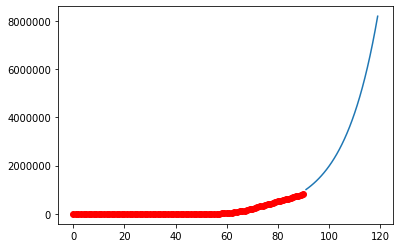

In [756]:
pred_x= np.arange(len(x),120)
# original plot
plt.scatter(x,y,label="Real data",color="red")
# Predicted logistic curve
plt.plot(pred_x, [exponential_growth(i,*fit_4[0]) for i in pred_x], label="Logistic model" )
plt.show()

#### Conclusion : We can conclude from some Logistic functions steadily underestimated the epidemic
#### But we can take some part from every Model defined here
#### Every Model used helps us in concluding about the epidemic

<center>
<img src="images/knownothing.gif" img width=500 //>
</center>

# SIR model:
We have seen some general behavior of the virus in agregated data, for the country where the coronavirus was originated and for four other interesting countries. There's a lot of information to be extracted from this data; for example, we haven't analyzed the effects of long/lat of countries. However, since our main purpose is to develop a predective model in order to understand the key factors that impact the COVID-19 transmission, I'll move on to one of the most famous epidemiologic models: SIR.

SIR is a simple model that considers a population that belongs to one of the following states:
Susceptible (S). The individual hasn't contracted the disease, but they can be infected due to transmisison from infected people. So all people that are capable of becoming infected are susceptible. 
Infected (I). All people that has the disease right now. Recovered people doe not come under it.
Recovered/Deceased (R). The disease may lead to one of two destinies: either the person survives, hence developing inmunity to the disease, or the person is deceased. 

**S** : Susceptible (Total Population - Confirmed_cases)  
**I** : Infected (Confirmed_cases - Recovered_cases - Deaths)  
**R** : Recovered or fatal (Recovered_Cases + Deaths)

### Epidemic or not ??
#### An infection turns into an epidemic if R0 > 1, it dies out if R0 < 1.

We are not epidemiologist but lets try!!!

##### According to R0 -CDC

https://wwwnc.cdc.gov/eid/article/26/7/20-0282_article


<center>
<img src="images/sirmodel.jpg" img width=500 //>
</center>

> # SIR model 

In [757]:
# Sum data datewise . So that we have total number of cases, total number of recovered cases and total number of deaths on each date.
CDR_modeldata = CDR.copy()
CDR_modeldata = CDR_modeldata.groupby(["ObservationDate"]).sum()
CDR_modeldata.tail()

,Confirmed,Deaths,Recovered
ObservationDate,,,
04/17/2020,699706.0,36773.0,58545.0
04/18/2020,732197.0,38664.0,64840.0
04/19/2020,759086.0,40661.0,70337.0
04/20/2020,784326.0,42094.0,72329.0
04/21/2020,823786.0,44845.0,75204.0


In [758]:
# Infected cases is:
# Infected = confirmed_cases - Recovered_cases - deaths_cases
# for each date calculate infected cases
CDR_modeldata["Infected"] = CDR_modeldata["Confirmed"] - CDR_modeldata["Deaths"] - CDR_modeldata["Recovered"]

 [US population](https://www.census.gov/popclock/) Count

In [759]:
# total poulation of USA is:
total_population = 327200000
# Infected cases is:
# susceptible = total_population - confirmed_cases
# for each date calculate susceptible  cases
CDR_modeldata['Susceptible'] = total_population - CDR_modeldata['Confirmed']

In [760]:
# Calculating susceptible , infected and recovery from our CDR_modeldata around 21st Jan. So we colud predict what is the the behavious of change of infected,susceptible and recovered cases each day.
susceptible= CDR_modeldata['Susceptible'].tail(100).sum()
infected = CDR_modeldata['Infected'].tail(100).sum()
rec = CDR_modeldata['Recovered'].tail(100).sum()
deaths = CDR_modeldata['Deaths'].tail(100).sum()
recovered = rec+deaths

print("susceptible:",susceptible)
print("infected:" , infected)
print("recovered:" , recovered)
# These values will be initital S0,I0,R0 that will be provided to the model.Since the spread of corona started aronud 21st Jan we used that values as our intital values.

susceptible: 29763210753.0
infected: 10704472.0
recovered: 1284775.0


In [761]:
# defining the class
class SIR:
    def __init__(self, days=1000, Susceptible=950, Infected=50, Recovered=0, rateSI=0.05, rateIR=0.01):
        # No of days to predict for
        self.days = days
        # initital Susceptible value ie. S0
        self.Susceptible = Susceptible
        # initital Infected value ie. I0
        self.Infected = Infected
         # initital Recovered value ie. R0
        self.Recovered = Recovered
        # Rate at which Susceptible people move to infected(Transmission rate)
        self.rateSI = rateSI
         # Rate at which Infected people move to Recovered
        self.rateIR = rateIR
        # total population
        self.numIndividuals = Susceptible + Infected + Recovered
        self.results = None
        self.modelRun = False

    def run(self):
        # List to hold Susceptible cases on each day
        Susceptible = [self.Susceptible]
        # List to hold Infected cases on each day
        Infected = [self.Infected]
         # List to hold Recovered cases on each day
        Recovered = [self.Recovered]
        # Run the loop for no of days to predict
        for step in range(1, self.days):
            # S_to_I calculates how many people move from susceptible to infected
            S_to_I = (self.rateSI * Susceptible[-1] * Infected[-1]) / self.numIndividuals
            # I_to_R calculates how many people move from infected to recovered
            I_to_R = Infected[-1] * self.rateIR
            # so for each new day Susceptible cases will be prev days Susceptible cases - S_to_I.
            # As S_to_I cases have moved to infected cases so they need to be subtracted.
            Susceptible.append(Susceptible[-1] - S_to_I)
            # so for each new day Infected cases will be prev days Infected cases + S_to_I - I_to_R. 
            # As S_to_I cases have moved to infected cases so they need to be added and I_to_R moved to recovered cases 
            # so they need to be subtracted.
            Infected.append(Infected[-1] + S_to_I - I_to_R)
            Recovered.append(Recovered[-1] + I_to_R)
        # Results is a dataframe that has all Susceptible,Infected,Recovered values.
        self.results = pd.DataFrame.from_dict({'Time':list(range(len(Susceptible))),
            'Susceptible':Susceptible, 'Infected':Infected, 'Recovered':Recovered},
            orient='index').transpose()
        print(self.results)
        self.modelRun = True
    # Plotting S,I,R
    def plot(self):
        if self.modelRun == False:
            print('Error: Model has not run. Please call SIR.run()')
            return
        print("plotting")
        plt.plot(self.results['Time'], self.results['Susceptible'], color='blue')
        plt.plot(self.results['Time'], self.results['Infected'], color='red')
        plt.plot(self.results['Time'], self.results['Recovered'], color='green')
        plt.xlabel('Days')
        plt.ylabel('Population')
        plt.legend(['Susceptible','Infected','Recovered'], prop={'size': 10}, loc='upper center', bbox_to_anchor=(0.5, 1.02), ncol=3, fancybox=True, shadow=True)
        plt.title(r'$\beta = {0}, \gamma = {1}$'.format(self.rateSI, self.rateIR))

In [762]:
# Sir class With initital values of S0 = susceptible(i.e. no of susceptible cases on 21st jan)
#I0 =infected(i.e. no of infected cases on 21st jan)
#R0 = recovered(i.e. no of Recovered cases on 21st jan)
# rateSI = 0.05
#rateIR = 0.01
sir = SIR(Susceptible=susceptible,Infected=infected,Recovered=recovered)
sir.run()

      Time   Susceptible      Infected     Recovered
0      0.0  2.976321e+10  1.070447e+07  1.284775e+06
1      1.0  2.976268e+10  1.113244e+07  1.391820e+06
2      2.0  2.976212e+10  1.157750e+07  1.503144e+06
3      3.0  2.976154e+10  1.204034e+07  1.618919e+06
4      4.0  2.976094e+10  1.252168e+07  1.739323e+06
..     ...           ...           ...           ...
995  995.0  2.001315e+08  1.467467e+07  2.956039e+10
996  996.0  2.001265e+08  1.453286e+07  2.956054e+10
997  997.0  2.001217e+08  1.439241e+07  2.956069e+10
998  998.0  2.001168e+08  1.425333e+07  2.956083e+10
999  999.0  2.001120e+08  1.411558e+07  2.956097e+10

[1000 rows x 4 columns]


plotting


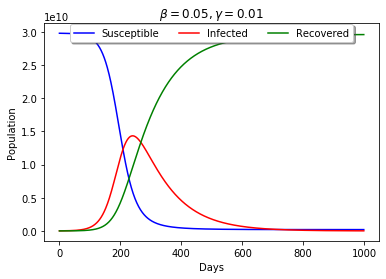

In [763]:
sir.plot()
plt.show()

      Time   Susceptible      Infected     Recovered
0      0.0  2.976321e+10  1.070447e+07  1.284775e+06
1      1.0  2.976225e+10  1.156044e+07  1.391820e+06
2      2.0  2.976121e+10  1.248482e+07  1.507424e+06
3      3.0  2.976008e+10  1.348308e+07  1.632272e+06
4      4.0  2.975887e+10  1.456111e+07  1.767103e+06
..     ...           ...           ...           ...
995  995.0  3.127955e+06  3.958527e+06  2.976811e+10
996  996.0  3.127917e+06  3.918979e+06  2.976815e+10
997  997.0  3.127880e+06  3.879826e+06  2.976819e+10
998  998.0  3.127843e+06  3.841065e+06  2.976823e+10
999  999.0  3.127807e+06  3.802690e+06  2.976827e+10

[1000 rows x 4 columns]
plotting


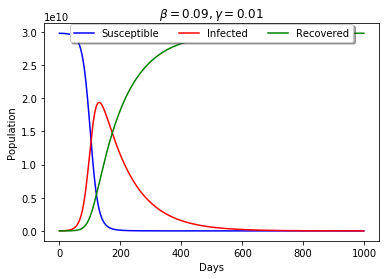

In [764]:
# Sir class With initital values of S0 = susceptible(i.e. no of susceptible cases on 21st jan)
#I0 =infected(i.e. no of infected cases on 21st jan)
#R0 = recovered(i.e. no of Recovered cases on 21st jan)
# rateSI = 0.09
#rateIR = 0.01
sir_1 = SIR(Susceptible=susceptible,Infected=infected,Recovered=recovered,rateSI=0.09, rateIR=0.01)
sir_1.run()
sir_1.plot()
plt.show()

### Observation; since susceptible people are fastly moving to infected. We increased rateSI from 0.05 to 0.09. Also since infected people are not moving fastly to recovered we kept rateIR very low in both plots.
### In first plot we observe that around august end we will have maximum of infected cases and then it will decrease. But this is not correct. 
### So we increased rateSI in second plot and observed that maximum number of infected cases will come around April end(as we are predicting from 21st Jan and peak will come after 100 days.)

> # Calling the API EoN Library

doing Gillespie simulation
done with simulations, now plotting


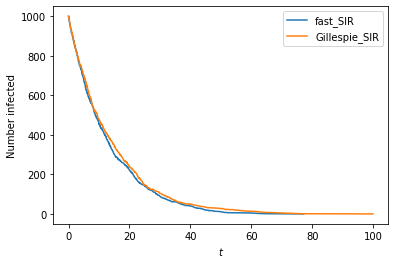

In [765]:
N = 10**6 # number of individuals as running for a larger number takes too much long for running
kave = 5  

G = nx.fast_gnp_random_graph(N, kave/(N-1))

# initializing th values from th CDR_modeldata 
rho = 0.001  #initial fraction infected
tau = 0.0016  #transmission rate
gamma = 0.085 #recovery rate

t1, S1, I1, R1 = EoN.fast_SIR(G, tau, gamma, rho=rho)
#instead of rho, we could specify a list of nodes as initial_infecteds, or
#specify neither and a single random node would be chosen as the index case.
print("doing Gillespie simulation")

t2, S2, I2, R2 = EoN.Gillespie_SIR(G, tau, gamma, rho=rho)
print("done with simulations, now plotting")

plt.plot(t1, I1, label = "fast_SIR")
plt.plot(t2, I2, label = "Gillespie_SIR")
plt.xlabel("$t$")
plt.ylabel("Number infected")
plt.legend()
plt.show()

In [766]:
## when we compare 1000 to totalpopulation i.e N- 10**6,
## its approximately same proportion of current cases in United states
## Also this confirms and adds to the outcome of other models used

# Conclusion:

1. Looking at all the models we have used we can conclude that there is not 1 model that can predict the outfall (or any specific parameter of covid-19)
2. The increase follows a **exponential growth** to a point (**Inflection Point**) but because the epidemic has to end one day, we conclude that it follows **Logistic Growth** Overall.
3. According to the Slope of **Growth Factor** which we plotted and observed we can see it is dropping to **1**, which means we are almost at the inflection Point
3. We Observe that **SIR model** fits the Best according to all the models we have used for United States Dataset.
4. According to our prediction of United States cases, the Number of Cases are going to **drop after April** (100 days since start of epidemic in the county) and things are going to be even better in **approximately next 60 Days int future**, but the overall effect is going to last for a longer time.
5. According to Logistic Model (which we trust for the overall cases model, and because we conclude that we have reached the inflection Point), Total Number of Infected Cases are goint to go to somewhere around **2X of current cases, i.e 1.6 Million cases**.

### Although none of the predictions can be 100 percent accurate as we are not Epidemiologists but (based on Dataset) according to the sources, [Epidemiologists](https://calmatters.org/health/coronavirus/2020/04/coronavirus-pandemic-models-pros-cons-california/) themselves are using different models for the prediction of different phases of the outfall, including "SEIR", "SIR-QD" ( SIR with additional parameters) to predict the outfall of epidemic.

<center>
Just like understanding the complexity relations in GOT, we found and are able to find perfect model for the COVID-19 
<img src= "images/multidimensionalGOT.png" img width=500 />
</center>

Prevention To avoid the critical situation and to **Flatten the Curve**

1. Avoid contact with people who are sick.
2. Avoid touching your eyes, nose, and mouth.
3. Stay home when you are sick.
4. Cover your cough or sneeze with a tissue, then throw the tissue in the trash.
5. Clean and disinfect frequently touched objects and surfaces using a regular household
6. Wash your hands often with soap and water, especially after going to the bathroom; before eating; and after blowing your nose, coughing, or sneezing. If soap and water are not readily available, use an alcohol-based hand sanitizer.

RO Value : https://wwwnc.cdc.gov/eid/article/26/7/20-0282_article?deliveryName=USCDC_333-DM25287
cases value : https://www.washington.edu/news/2020/04/10/covid-19-peak-active-cases/


<center>
Social Distancing is essential to "Flatten the curve"
<img src="images/socialdistancing.jpg" img width=500 />
</center>

The co-recipient of the 2018 ACM A.M. Turing Award [Yoshua Bengio](https://yoshuabengio.org/2020/03/23/peer-to-peer-ai-tracing-of-covid-19/) says the best thing we can do is build something that would keep track of the probability that you are infected based on where you have been and the encounters you made and would share that risk information with people’s phones you encounter so their app could update their own risk estimation. 



# THE END
